### Environment set-up and loading dependencies


In [2]:
#Data analysis
import pandas as pd
import numpy as np
#Data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
sns.set(font_scale=1)
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
#Modeling
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn_crfsuite import CRF, scorers, metrics
from sklearn_crfsuite.metrics import flat_classification_report
from sklearn.metrics import classification_report, make_scorer
from sklearn.model_selection import RandomizedSearchCV
import scipy.stats
import eli5

In [3]:
# !pip install eli5

## Obtain the data

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf


# # 2- Importing Data 

# In[59]:


data_path = "train_data.csv"

data = pd.read_csv(data_path, sep=';',  header=None, skip_blank_lines=False)
# filling the first column that determines which sentence each word belongs to.
# data.fillna(method = 'ffill', inplace = True)
data.rename(columns = {0:'data'}, inplace = True)
data.head()


# In[61]:


import pandas as pd

# file_path = 'drive/MyDrive/Colab Notebooks/compete data/train_gt.csv'
file_path = 'train_gt.csv'

label = pd.read_csv(file_path, header=None, names=['Labels'], skip_blank_lines=False)
data['label'] = label
data = data[['data', 'label']]

data['data'] = data['data'].fillna('')
data['label'] = data['label'].fillna('')

data


,data,label
0,,
1,EU,B-ORG
2,rejects,O
3,German,B-MISC
4,call,O
...,...,...
219547,,
219548,Swansea,B-ORG
219549,1,O
219550,Lincoln,B-ORG


In [5]:
data[:20]

,data,label
0,,
1,EU,B-ORG
2,rejects,O
3,German,B-MISC
4,call,O
5,to,O
6,boycott,O
7,British,B-MISC
8,lamb,O
9,.,O


In [6]:
import pandas as pd

df = pd.DataFrame(data)

# Create a new column for sentences
df['sentence'] = (df['data'] == '').cumsum()

# Drop rows with blank lines
df = df[df['data'] != '']

# Print the resulting dataframe
print(df)

           data   label  sentence
1            EU   B-ORG         1
2       rejects       O         1
3        German  B-MISC         1
4          call       O         1
5            to       O         1
...         ...     ...       ...
219546    three       O     22330
219548  Swansea   B-ORG     22331
219549        1       O     22331
219550  Lincoln   B-ORG     22331
219551        2       O     22331

[197221 rows x 3 columns]


In [7]:
df[:30]

,data,label,sentence
1,EU,B-ORG,1
2,rejects,O,1
3,German,B-MISC,1
4,call,O,1
5,to,O,1
6,boycott,O,1
7,British,B-MISC,1
8,lamb,O,1
9,.,O,1
11,Peter,B-PER,2


In [8]:
# df.to_csv('file_test_1.csv', index=False)

In [9]:
import pandas as pd

df = pd.read_csv('file_test.csv')

df


,data,label,sentence,POS
0,EU,B-ORG,1,NN
1,rejects,O,1,NNS
2,German,B-MISC,1,JJ
3,call,O,1,NN
4,to,O,1,TO
...,...,...,...,...
197216,three,O,22330,CD
197217,Swansea,B-ORG,22331,NN
197218,1,O,22331,CD
197219,Lincoln,B-ORG,22331,NN


In [10]:
# import nltk
# def tag_pos(row):
#     word = row['data']
#     pos_tag = nltk.pos_tag([word])[0][1]
#     return pos_tag

# df['POS'] = df.apply(tag_pos, axis=1)

In [11]:
# nltk.download('averaged_perceptron_tagger')

In [12]:
# import pandas as pd
# from nltk.tokenize import word_tokenize
# from nltk.tag import pos_tag

# # Define a function to add POS tags
# def add_pos_tags(text):
#     # Tokenize the text
#     tokens = word_tokenize(text)
#     # Get POS tags
#     pos_tags = pos_tag(tokens)
#     return pos_tags

# # Loop through each sentence and add POS tags
# for sentence in df.groupby("sentence"):
#     text = " ".join(sentence[1]["data"])
#     pos_tags = add_pos_tags(text)
#     # Add POS tags to a new column
#     df.loc[sentence[0], "POS1"] = pos_tags

# # Print the modified dataframe
# print(df)

## Scrubbing / Cleaning the data 

In [13]:
#Let us take a sneak-peak into the dataset first
df.head()

,data,label,sentence,POS
0,EU,B-ORG,1,NN
1,rejects,O,1,NNS
2,German,B-MISC,1,JJ
3,call,O,1,NN
4,to,O,1,TO


In [14]:
#The dataset does not have any header currently. We can use the first row as a header as it has the relevant headings.
#We will make the first row as the heading, remove the first row and re-index the dataset
# data.columns = data.iloc[0]
# data = data[1:]
# data.columns = ['data','POS','Tag']
# data = data.reset_index(drop=True)
# data.head()

In [15]:
df.shape

(197221, 4)

In [16]:
#We have 66161 samples and 5 features. We will understand them in detail in the exploration step.
#Lets check for any missing values in the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197221 entries, 0 to 197220
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   data      197221 non-null  object
 1   label     195043 non-null  object
 2   sentence  197221 non-null  int64 
 3   POS       197221 non-null  object
dtypes: int64(1), object(3)
memory usage: 6.0+ MB


## Exploring / Visualizing our data

In [17]:
df[:20]

,data,label,sentence,POS
0,EU,B-ORG,1,NN
1,rejects,O,1,NNS
2,German,B-MISC,1,JJ
3,call,O,1,NN
4,to,O,1,TO
5,boycott,O,1,NN
6,British,B-MISC,1,JJ
7,lamb,O,1,NN
8,.,O,1,.
9,Peter,B-PER,2,NNP


In [18]:
# A class to retrieve the sentences from the dataset
class getsentence(object):
    
    def __init__(self, data):
        self.n_sent = 1.0
        self.data = data
        self.empty = False
        agg_func = lambda s: [(w, p, t) for w, p, t in zip(s["data"].values.tolist(),
                                                           s["POS"].values.tolist(),
                                                           s["label"].values.tolist())]
        self.grouped = self.data.groupby("sentence").apply(agg_func)
        self.sentences = [s for s in self.grouped]

In [19]:
getter = getsentence(df)
sentences = getter.sentences
#This is how a sentence will look like. 
print(sentences[0])

[('EU', 'NN', 'B-ORG'), ('rejects', 'NNS', 'O'), ('German', 'JJ', 'B-MISC'), ('call', 'NN', 'O'), ('to', 'TO', 'O'), ('boycott', 'NN', 'O'), ('British', 'JJ', 'B-MISC'), ('lamb', 'NN', 'O'), ('.', '.', 'O')]


In [20]:
#Lets find the number of words in the dataset
words = list(set(df["data"].values))
n_words = len(words)
print(n_words)

23086


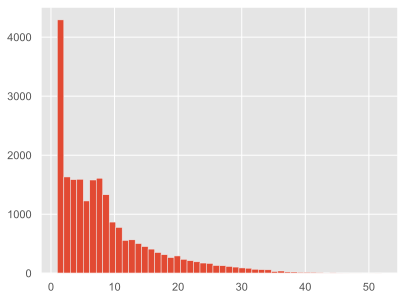

In [21]:
# #Lets visualize how the sentences are distributed by their length
plt.style.use("ggplot")
plt.hist([len(s) for s in sentences], bins=50)
plt.show()

In [22]:
df['label'].unique()

array(['B-ORG', 'O', 'B-MISC', 'B-PER', 'I-PER', 'B-LOC', 'I-ORG', nan,
       'I-MISC', 'I-LOC'], dtype=object)

In [23]:
#Lets find out the longest sentence length in the dataset
maxlen = max([len(s) for s in sentences])
print ('Maximum sentence length:', maxlen)

Maximum sentence length: 52


In [24]:
# #Words tagged as B-org
df.loc[df['label'] == 'B-ORG', 'data'].head()

0              EU
14       European
48       European
93     Commission
128      European
Name: data, dtype: object

In [25]:
# #Words tagged as I-org
df.loc[df['label'] == 'I-ORG', 'data'].head()

15     Commission
49          Union
129         Union
381      National
382       Farmers
Name: data, dtype: object

In [26]:
# #Words tagged as B-per
df.loc[df['label'] == 'B-PER', 'data'].head()

9         Peter
53       Werner
97     Nikolaus
141       Franz
170    Fischler
Name: data, dtype: object

In [27]:
# #Words tagged as I-per
df.loc[df['label'] == 'I-PER', 'data'].head()

10     Blackburn
54     Zwingmann
98           van
99           der
100          Pas
Name: data, dtype: object

In [28]:
# #Words tagged as B-LOC
df.loc[df['label'] == 'B-LOC', 'data'].head()

11     BRUSSELS
43      Germany
66      Britain
177     Britain
179      France
Name: data, dtype: object

In [29]:
# #Words tagged as I-LOC
df.loc[df['label'] == 'I-LOC', 'data'].head()

674        Strait
1785      Heights
1794         East
1977       States
2231    Kurdistan
Name: data, dtype: object

In [30]:
# #Words tagged as B-MISC
df.loc[df['label'] == 'B-MISC', 'data'].head()

2       German
6      British
22      German
28     British
172    EU-wide
Name: data, dtype: object

In [31]:
# #Words tagged as I-MISC
df.loc[df['label'] == 'B-MISC', 'data'].head()

2       German
6      British
22      German
28     British
172    EU-wide
Name: data, dtype: object

In [32]:
# #Words tagged as O
df.loc[df['label'] == 'O', 'data'].head()

1    rejects
3       call
4         to
5    boycott
7       lamb
Name: data, dtype: object

C:\Users\hieuq\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


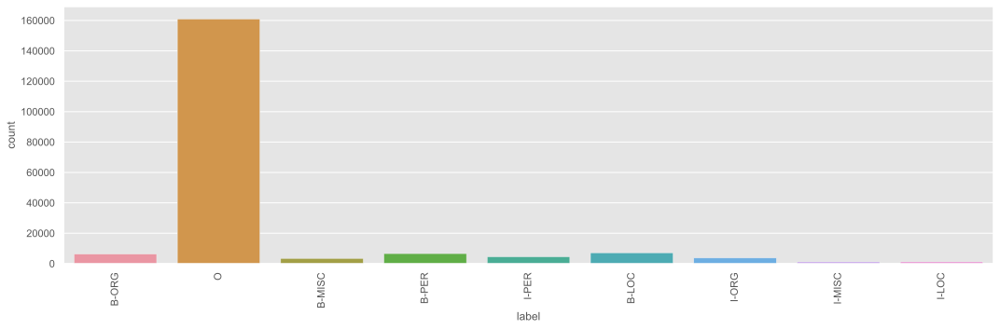

In [33]:
# #Words distribution across Tags
plt.figure(figsize=(15, 5))
ax = sns.countplot('label', data=df)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center")
plt.tight_layout()
plt.show()

C:\Users\hieuq\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


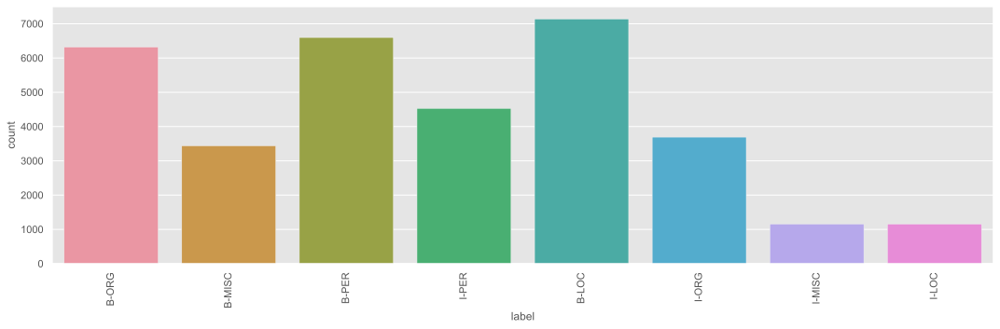

In [34]:
# #Words distribution across Tags without O tag
plt.figure(figsize=(15, 5))
ax = sns.countplot('label', data=df.loc[df['label'] != 'O'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center")
plt.tight_layout()
plt.savefig("img.png")
plt.show()

C:\Users\hieuq\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


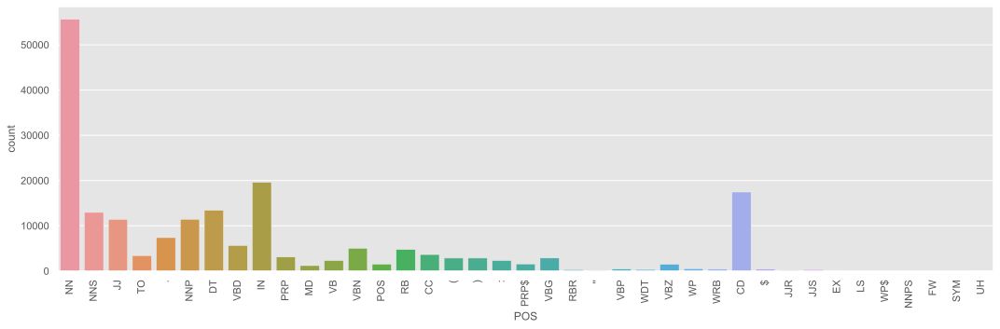

In [57]:
# #Words distribution across POS
plt.figure(figsize=(15, 5))
ax = sns.countplot('POS', data=df, orient='h')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center")
plt.tight_layout()
plt.show()

### Random Forest classifier

In [73]:
label_mapping = {'O': 0, 'B-ORG': 1, 'B-MISC': 2, 'B-PER': 3, 'I-PER': 4, 'B-LOC': 5, 'I-ORG': 6, 'I-MISC': 7, 'I-LOC': 8}

In [74]:
df['la'] = df['label'].map(label_mapping)

In [75]:
df.head()

,data,label,sentence,POS,la
0,EU,B-ORG,1,NN,1.0
1,rejects,O,1,NNS,0.0
2,German,B-MISC,1,JJ,2.0
3,call,O,1,NN,0.0
4,to,O,1,TO,0.0


In [98]:
df['POS'].unique()

array(['NN', 'NNS', 'JJ', 'TO', '.', 'NNP', 'DT', 'VBD', 'IN', 'PRP',
       'MD', 'VB', 'VBN', 'POS', 'RB', 'CC', '(', ')', ':', 'PRP$', 'VBG',
       'RBR', "''", 'VBP', 'WDT', 'VBZ', 'WP', 'WRB', 'CD', '$', 'JJR',
       'JJS', 'EX', 'LS', 'WP$', 'NNPS', 'FW', 'SYM', 'UH'], dtype=object)

In [99]:
pos_mapping = {
    'NN': 1, 'NNS': 2, 'JJ': 3, 'TO': 4, '.': 5, 'NNP': 6, 'DT': 7, 'VBD': 8, 'IN': 9, 'PRP': 10,
    'MD': 11, 'VB': 12, 'VBN': 13, 'POS': 14, 'RB': 15, 'CC': 16, '(': 17, ')': 18, ':': 19, 'PRP$': 20,
    'VBG': 21, 'RBR': 22, "''": 23, 'VBP': 24, 'WDT': 25, 'VBZ': 26, 'WP': 27, 'WRB': 28, 'CD': 29, '$': 30,
    'JJR': 31, 'JJS': 32, 'EX': 33, 'LS': 34, 'WP$': 35, 'NNPS': 36, 'FW': 37, 'SYM': 38, 'UH': 39
}

# Map POS tags to corresponding numbers
df['POS_number'] = df['POS'].map(pos_mapping)

print(df)

           data   label  sentence  POS   la  POS_number
0            EU   B-ORG         1   NN  1.0           1
1       rejects       O         1  NNS  0.0           2
2        German  B-MISC         1   JJ  2.0           3
3          call       O         1   NN  0.0           1
4            to       O         1   TO  0.0           4
...         ...     ...       ...  ...  ...         ...
197216    three       O     22330   CD  0.0          29
197217  Swansea   B-ORG     22331   NN  1.0           1
197218        1       O     22331   CD  0.0          29
197219  Lincoln   B-ORG     22331   NN  1.0           1
197220        2       O     22331   CD  0.0          29

[197221 rows x 6 columns]


In [82]:
#Simple feature map to feed arrays into the classifier. 
def feature_map(word):
    return np.array([word.istitle(), word.islower(), word.isupper(), len(word),
                     word.isdigit(),  word.isalpha()])

In [115]:
#We divide the dataset into train and test sets
words = [np.append(feature_map(df.loc[i, 'data']), df.loc[i, 'POS_number']) for i in range(len(df["data"].values.tolist()))]
tags = df["label"].values.tolist()

In [116]:
#Lets see how the input array looks like
print(words[:5])

[array([0, 0, 1, 2, 0, 1, 1], dtype=int64), array([0, 1, 0, 7, 0, 1, 2], dtype=int64), array([1, 0, 0, 6, 0, 1, 3], dtype=int64), array([0, 1, 0, 4, 0, 1, 1], dtype=int64), array([0, 1, 0, 2, 0, 1, 4], dtype=int64)]


In [117]:
#Random Forest classifier
pred = cross_val_predict(RandomForestClassifier(n_estimators=200),X=words, y=tags, cv=5)

In [118]:
#Lets check the performance 
from sklearn.metrics import classification_report
report = classification_report(y_pred=pred, y_true=tags)
print(report)

              precision    recall  f1-score   support

       B-LOC       0.32      0.40      0.35      7140
      B-MISC       0.63      0.45      0.52      3438
       B-ORG       0.33      0.26      0.29      6320
       B-PER       0.30      0.57      0.39      6600
       I-LOC       0.00      0.00      0.00      1156
      I-MISC       0.52      0.08      0.14      1154
       I-ORG       0.28      0.07      0.11      3692
       I-PER       0.25      0.02      0.04      4528
           O       0.96      0.98      0.97    161015
         nan       0.88      1.00      0.93      2178

    accuracy                           0.86    197221
   macro avg       0.45      0.38      0.37    197221
weighted avg       0.85      0.86      0.85    197221



# Test with another model

In [120]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(words, tags, test_size=0.20)

print(len(X_train), len(X_test))

157776 39445


In [121]:
from sklearn.naive_bayes import MultinomialNB

multinomial_naive_bayes = MultinomialNB(alpha=0.01)
multinomial_naive_bayes.fit(X_train, y_train)

MultinomialNB(alpha=0.01)

In [122]:
from sklearn.metrics import classification_report

# y_dev_predictions = multinomial_naive_bayes.predict(X_dev_features)

y_dev_predictions = multinomial_naive_bayes.predict(X_test)

print(classification_report(y_pred=y_dev_predictions, y_true=y_test, digits=4, zero_division=1))

              precision    recall  f1-score   support

       B-LOC     0.2731    0.2977    0.2849      1431
      B-MISC     1.0000    0.0000    0.0000       707
       B-ORG     0.1673    0.2207    0.1903      1282
       B-PER     0.2283    0.5750    0.3268      1313
       I-LOC     1.0000    0.0000    0.0000       244
      I-MISC     1.0000    0.0000    0.0000       230
       I-ORG     0.0000    0.0000    0.0000       716
       I-PER     0.1340    0.1758    0.1521       927
           O     0.9501    0.9206    0.9351     32148
         nan     1.0000    0.0000    0.0000       447

    accuracy                         0.7915     39445
   macro avg     0.5753    0.2190    0.1889     39445
weighted avg     0.8417    0.7915    0.7931     39445



In [123]:
from sklearn.neural_network import MLPClassifier

# neural_network = MLPClassifier(hidden_layer_sizes=(64,128,256,256,), verbose=True, learning_rate_init=0.0001, alpha=0.001, max_iter=10)
neural_network = MLPClassifier(hidden_layer_sizes=(256,256,512,512), verbose=True)
neural_network.fit(X_train, y_train)

Iteration 1, loss = 0.45427879
Iteration 2, loss = 0.41793568
Iteration 3, loss = 0.40982015
Iteration 4, loss = 0.40609128
Iteration 5, loss = 0.40268441
Iteration 6, loss = 0.40138354
Iteration 7, loss = 0.39965142
Iteration 8, loss = 0.39787413
Iteration 9, loss = 0.39689508
Iteration 10, loss = 0.39582160
Iteration 11, loss = 0.39480935
Iteration 12, loss = 0.39398805
Iteration 13, loss = 0.39299066
Iteration 14, loss = 0.39242441
Iteration 15, loss = 0.39182861
Iteration 16, loss = 0.39130017
Iteration 17, loss = 0.39104979
Iteration 18, loss = 0.39032746
Iteration 19, loss = 0.38971087
Iteration 20, loss = 0.38956643
Iteration 21, loss = 0.38920437
Iteration 22, loss = 0.38885551
Iteration 23, loss = 0.38847751
Iteration 24, loss = 0.38774245
Iteration 25, loss = 0.38842115
Iteration 26, loss = 0.38796876
Iteration 27, loss = 0.38707781
Iteration 28, loss = 0.38718793
Iteration 29, loss = 0.38703972
Iteration 30, loss = 0.38660066
Iteration 31, loss = 0.38650540
Iteration 32, los

C:\Users\hieuq\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:709: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


MLPClassifier(hidden_layer_sizes=(256, 256, 512, 512), verbose=True)

In [124]:
from sklearn.metrics import classification_report

y_dev_predictions = neural_network.predict(X_test)

print(classification_report(y_pred=y_dev_predictions, y_true=y_test, digits=4, zero_division=1,
                            labels=['B-MISC', 'I-MISC', 'B-LOC', 'I-LOC', 'B-ORG', 'I-ORG', 'B-PER', 'I-PER']))

              precision    recall  f1-score   support

      B-MISC     0.6726    0.4243    0.5204       707
      I-MISC     0.4444    0.0870    0.1455       230
       B-LOC     0.3258    0.4654    0.3833      1431
       I-LOC     0.1000    0.0041    0.0079       244
       B-ORG     0.3699    0.2395    0.2907      1282
       I-ORG     0.3129    0.0642    0.1066       716
       B-PER     0.2952    0.5644    0.3877      1313
       I-PER     0.2895    0.0119    0.0228       927

   micro avg     0.3446    0.3054    0.3238      6850
   macro avg     0.3513    0.2326    0.2331      6850
weighted avg     0.3537    0.3054    0.2819      6850



In [125]:
from pandas import read_csv

test_data = read_csv('test_data.csv', sep=';',  header=None, skip_blank_lines=False)
test_data.rename(columns = {0:'data'}, inplace = True)
test_data['data'] = test_data['data'].fillna('')
# test_d = test_data["data"]

In [126]:
# import nltk
# def tag_pos(row):
#     word = row['data']
#     pos_tag = nltk.pos_tag([word])[0][1]
#     return pos_tag
test_data['POS'] = test_data.apply(tag_pos, axis=1)

In [127]:
test_data

,data,POS
0,RUGBY,NN
1,UNION,NN
2,-,NN
3,CUTTITTA,NN
4,BACK,NN
...,...,...
49296,3,CD
49297,11,CD
49298,8,CD
49299,30,CD


In [128]:
pos_mapping = {
    'NN': 1, 'NNS': 2, 'JJ': 3, 'TO': 4, '.': 5, 'NNP': 6, 'DT': 7, 'VBD': 8, 'IN': 9, 'PRP': 10,
    'MD': 11, 'VB': 12, 'VBN': 13, 'POS': 14, 'RB': 15, 'CC': 16, '(': 17, ')': 18, ':': 19, 'PRP$': 20,
    'VBG': 21, 'RBR': 22, "''": 23, 'VBP': 24, 'WDT': 25, 'VBZ': 26, 'WP': 27, 'WRB': 28, 'CD': 29, '$': 30,
    'JJR': 31, 'JJS': 32, 'EX': 33, 'LS': 34, 'WP$': 35, 'NNPS': 36, 'FW': 37, 'SYM': 38, 'UH': 39
}

# Map POS tags to corresponding numbers
test_data['POS_number'] = test_data['POS'].map(pos_mapping)

In [132]:
test_data[20:40]

,data,POS,POS_number
20,on,NN,1
21,Friday,NN,1
22,for,NN,1
23,their,NN,1
24,friendly,NN,1
25,against,NN,1
26,Scotland,NN,1
27,at,NN,1
28,Murrayfield,NN,1
29,more,NN,1


In [129]:
words_test = [np.append(feature_map(test_data.loc[i, 'data']), test_data.loc[i, 'POS_number']) for i in range(len(test_data["data"].values.tolist()))]

In [130]:
words_test

[array([0, 0, 1, 6, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 6, 0, 0, 1], dtype=int64),
 array([0, 0, 0, 2, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 9, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 5, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 4, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 6, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 6, 0, 0, 1], dtype=int64),
 array([1, 0, 1, 2, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 5, 0, 0, 1], dtype=int64),
 array([0, 0, 0, 2, 0, 0, 1], dtype=int64),
 array([0, 0, 0, 1, 0, 0, 1], dtype=int64),
 array([0, 0, 1, 5, 0, 0, 1], dtype=int64),
 array([ 0,  0,  0, 11,  0,  0,  3], dtype=int64),
 array([0, 0, 0, 1, 0, 0, 1], dtype=int64),
 array([1, 0, 0, 6, 0, 0, 1], dtype=int64),
 array([0, 1, 0, 9, 0, 0, 1], dtype=int64),
 array([1, 0, 0, 9, 0, 0, 1], dtype=int64),
 array([1, 0, 0, 9, 0, 0, 1], dtype=int64),
 array([0, 0, 0, 1, 0, 0, 1], dtype=int64),
 array([0, 1, 0, 3, 0, 0, 1], dtype=int64),
 array([1, 0, 0, 7, 0, 0, 1], dtype=int64),
 array([0, 1, 0, 4, 0, 0,

In [133]:
y_test_d_predictions = neural_network.predict(words_test)

In [134]:
y_test_d_predictions

array(['O', 'O', 'O', ..., 'O', 'O', 'O'], dtype='<U6')

In [135]:
import numpy as np
import csv

csv_file_path = 'output_nn.csv'

with open(csv_file_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    for item in y_test_d_predictions:
        csvwriter.writerow([item])

print(f"Array has been written to {csv_file_path}")

Array has been written to output_nn.csv


In [136]:
import zipfile

csv_file_path = 'output_nn.csv'
zip_file_path = 'output_nn.csv.zip'

# Create a Zip file and add the CSV file to it
with zipfile.ZipFile(zip_file_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(csv_file_path, arcname='output_nn.csv')

print(f"{csv_file_path} has been zipped to {zip_file_path}")

output_nn.csv has been zipped to output_nn.csv.zip


### Conditional Random Fields classifier

In [63]:
# Feature set
def word2features(sent, i):
    word = sent[i][0]
    postag = sent[i][1]

    features = {
        'bias': 1.0,
        'word.lower()': word.lower(),
        'word[-3:]': word[-3:],
        'word[-2:]': word[-2:],
        'word.isupper()': word.isupper(),
        'word.istitle()': word.istitle(),
        'word.isdigit()': word.isdigit(),
        'postag': postag,
        'postag[:2]': postag[:2],
    }
    if i > 0:
        word1 = sent[i-1][0]
        postag1 = sent[i-1][1]
        features.update({
            '-1:word.lower()': word1.lower(),
            '-1:word.istitle()': word1.istitle(),
            '-1:word.isupper()': word1.isupper(),
            '-1:postag': postag1,
            '-1:postag[:2]': postag1[:2],
        })
    else:
        features['BOS'] = True

    if i < len(sent)-1:
        word1 = sent[i+1][0]
        postag1 = sent[i+1][1]
        features.update({
            '+1:word.lower()': word1.lower(),
            '+1:word.istitle()': word1.istitle(),
            '+1:word.isupper()': word1.isupper(),
            '+1:postag': postag1,
            '+1:postag[:2]': postag1[:2],
        })
    else:
        features['EOS'] = True

    return features

In [64]:
def sent2features(sent):
    return [word2features(sent, i) for i in range(len(sent))]

def sent2labels(sent):
    return [label for token, postag, label in sent]

In [65]:
#Creating the train and test set
X = [sent2features(s) for s in sentences]
y = [sent2labels(s) for s in sentences]

In [66]:
X

[[{'bias': 1.0,
   'word.lower()': 'eu',
   'word[-3:]': 'EU',
   'word[-2:]': 'EU',
   'word.isupper()': True,
   'word.istitle()': False,
   'word.isdigit()': False,
   'postag': 'NN',
   'postag[:2]': 'NN',
   'BOS': True,
   '+1:word.lower()': 'rejects',
   '+1:word.istitle()': False,
   '+1:word.isupper()': False,
   '+1:postag': 'NNS',
   '+1:postag[:2]': 'NN'},
  {'bias': 1.0,
   'word.lower()': 'rejects',
   'word[-3:]': 'cts',
   'word[-2:]': 'ts',
   'word.isupper()': False,
   'word.istitle()': False,
   'word.isdigit()': False,
   'postag': 'NNS',
   'postag[:2]': 'NN',
   '-1:word.lower()': 'eu',
   '-1:word.istitle()': False,
   '-1:word.isupper()': True,
   '-1:postag': 'NN',
   '-1:postag[:2]': 'NN',
   '+1:word.lower()': 'german',
   '+1:word.istitle()': True,
   '+1:word.isupper()': False,
   '+1:postag': 'JJ',
   '+1:postag[:2]': 'JJ'},
  {'bias': 1.0,
   'word.lower()': 'german',
   'word[-3:]': 'man',
   'word[-2:]': 'an',
   'word.isupper()': False,
   'word.istit

In [57]:
#Creating the CRF model
crf = CRF(algorithm='lbfgs',
          c1=0.1,
          c2=0.1,
          max_iterations=100,
          all_possible_transitions=False)

In [58]:
# !pip install git+https://github.com/MeMartijn/updated-sklearn-crfsuite.git#egg=sklearn_crfsuite

In [59]:
#We predcit using the same 5 fold cross validation
pred = cross_val_predict(estimator=crf, X=X, y=y, cv=5)

TypeError: expected bytes, float found

In [53]:
X

[[{'bias': 1,
   'word.lower()': 'eu',
   'word[-3:]': 'EU',
   'word[-2:]': 'EU',
   'word.isupper()': True,
   'word.istitle()': False,
   'word.isdigit()': False,
   'postag': 'NN',
   'postag[:2]': 'NN',
   'BOS': True,
   '+1:word.lower()': 'rejects',
   '+1:word.istitle()': False,
   '+1:word.isupper()': False,
   '+1:postag': 'NNS',
   '+1:postag[:2]': 'NN'},
  {'bias': 1,
   'word.lower()': 'rejects',
   'word[-3:]': 'cts',
   'word[-2:]': 'ts',
   'word.isupper()': False,
   'word.istitle()': False,
   'word.isdigit()': False,
   'postag': 'NNS',
   'postag[:2]': 'NN',
   '-1:word.lower()': 'eu',
   '-1:word.istitle()': False,
   '-1:word.isupper()': True,
   '-1:postag': 'NN',
   '-1:postag[:2]': 'NN',
   '+1:word.lower()': 'german',
   '+1:word.istitle()': True,
   '+1:word.isupper()': False,
   '+1:postag': 'JJ',
   '+1:postag[:2]': 'JJ'},
  {'bias': 1,
   'word.lower()': 'german',
   'word[-3:]': 'man',
   'word[-2:]': 'an',
   'word.isupper()': False,
   'word.istitle()':

In [45]:
y

[['B-ORG', 'O', 'B-MISC', 'O', 'O', 'O', 'B-MISC', 'O', 'O'],
 ['B-PER', 'I-PER'],
 ['B-LOC', 'O'],
 ['O',
  'B-ORG',
  'I-ORG',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'B-MISC',
  'O',
  'O',
  'O',
  'O',
  'O',
  'B-MISC',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O'],
 ['B-LOC',
  'O',
  'O',
  'O',
  'O',
  'B-ORG',
  'I-ORG',
  'O',
  'O',
  'O',
  'B-PER',
  'I-PER',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'B-LOC',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O'],
 [nan,
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O'],
 [nan,
  'O',
  'B-ORG',
  'O',
  'O',
  'O',
  'B-PER',
  'I-PER',
  'I-PER',
  'I-PER',
  'O',
  'O',
  'O',
  'O',
  'O'],
 ['O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'O',
  'B-ORG',
  'I-ORG',
  'O'],

In [ ]:
#Lets evaluate the mode
report = flat_classification_report(y_pred=pred, y_true=y)
print(report)

In [42]:
#Tuning the parameters manually, setting c1 = 10
crf2 = CRF(algorithm='lbfgs',
          c1=10,
          c2=0.1,
          max_iterations=100,
          all_possible_transitions=False)

In [43]:
pred = cross_val_predict(estimator=crf2, X=X, y=y, cv=5)
report = flat_classification_report(y_pred=pred, y_true=y)
print(report)

TypeError: expected bytes, float found

In [44]:
crf2.fit(X, y)

TypeError: expected bytes, float found

### Hyperparameter tuning using Randomized CV Search

In [60]:
labels = list(crf2.classes_)
labels = list(filter(lambda a: a != 'O', labels))
print(labels)

ValueError: Invalid model file 'C:\\Users\\hieuq\\AppData\\Local\\Temp\\modelp31nzdhd.crfsuite'

In [61]:
%%time
crf3 = CRF(
    algorithm='lbfgs',
    max_iterations=100,
    all_possible_transitions=True
)
params_space = {
    'c1': scipy.stats.expon(scale=0.5),
    'c2': scipy.stats.expon(scale=0.05),
}

# use the same metric for evaluation
f1_scorer = make_scorer(metrics.flat_f1_score,
                        average='weighted', labels=labels)

# search
rs = RandomizedSearchCV(crf, params_space,
                        cv=3,
                        verbose=1,
                        n_jobs=-1,
                        n_iter=50,
                        scoring=f1_scorer)
rs.fit(X, y)

NameError: name 'labels' is not defined

In [62]:
print('Best parameters:', rs.best_params_)
print('Best CV score:', rs.best_score_)
print('Model size: {:0.2f}M'.format(rs.best_estimator_.size_ / 1000000))

NameError: name 'rs' is not defined

In [63]:
sorted_labels = sorted(
    labels,
    key=lambda name: (name[1:], name[0]))

NameError: name 'labels' is not defined

In [64]:
crf3 = rs.best_estimator_
y_pred = crf3.predict(X)
print(metrics.flat_classification_report(
    y, y_pred, labels=sorted_labels, digits=3))

NameError: name 'rs' is not defined

In [65]:
crf3.fit(X,y)

TypeError: expected bytes, float found

In [66]:
eli5.show_weights(crf3, top=30)

ValueError: Invalid model file 'C:\\Users\\hieuq\\AppData\\Local\\Temp\\modelhee2f_h3.crfsuite'